# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [14]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data




## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

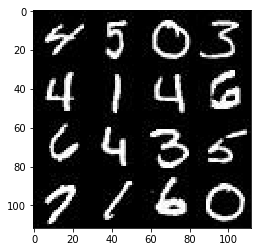

In [15]:
show_n_images = 16

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

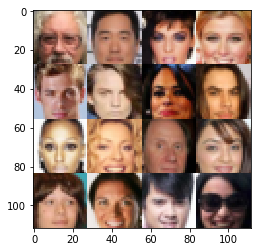

In [16]:
show_n_images = 16

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [18]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width,image_height,image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, shape=[], name='learning_rate')
    return inputs_real, inputs_z,learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [19]:
# review:
# 如果要进一步的提升模型的效率，你可以使用0.8概率的dropout和Xavier初始化你的权重。
# Xavier可以通过下面的方法实现，在tf.layers.conv2d中，将tf.contrib.layers.xavier_initializer()传入作为kernel_initializerparameter的值。
# Dropout可以通过在每一层的Leaky Relu后面加上加上dropout层（tf.nn.dropout）

def buildlayer(x,filters,kernel_size,strides,alpha):
    x1 = tf.layers.conv2d(x, filters, kernel_size, strides=strides, padding='same'
                          ,kernel_initializer=tf.contrib.layers.xavier_initializer())
    x1 = tf.layers.batch_normalization(x1, training=True)
    x1 = tf.maximum(alpha * x1, x1)
    x1 = tf.nn.dropout(x1, keep_prob=0.8)
    return x1

def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = buildlayer(images, 32, 5, 2 ,alpha)
        x2 = buildlayer(x1, 64, 5, 2 ,alpha)
        x3 = buildlayer(x2, 128,5, 2 ,alpha)
        x4 = buildlayer(x3, 256,5, 2 ,alpha)
        x = tf.reshape( x4,(-1,2*2*256))
        logits = tf.layers.dense(x, 1, activation=None)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [20]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = not is_train
    alpha = 0.2
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=True)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        #print('x2:',x2.get_shape())
        # 7x7x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        #print('x3:',x3.get_shape())
        # 14x14x64 now
        
        x4 = tf.layers.conv2d_transpose(x3, 32, 5, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4, training=True)
        x4 = tf.maximum(alpha * x4, x4)
        # 28x28x32 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 3, strides=1, padding='same')
        
        out = tf.tanh(logits)
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [21]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1 - 0.1)))#0.1 as  smooth
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [22]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [23]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [24]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1           
#                 review 我们需要将real images 进行标准化
#                 Tanh is used as the last layer of the Generator output
#                 , meaning the generated images by Generator will be between -1 and 1. 
#                 But currently, batch_images lies between -0.5 to 0.5
#                 , so we would need to rescale the true images to the scale between -1 to 1 too
#                 . we can use batch_images = batch_images*2 to normalize the input to Discriminator
                batch_images = batch_images * 2 

                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                feed = {input_real:batch_images,input_z:batch_z,lr:learning_rate}
                sess.run(d_train_opt, feed_dict=feed)
                sess.run(g_train_opt, feed_dict=feed)
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 64, input_z, image_channels, data_image_mode)
     

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.8724... Generator Loss: 2.7431
Epoch 1/2... Discriminator Loss: 0.6399... Generator Loss: 3.8551
Epoch 1/2... Discriminator Loss: 0.6273... Generator Loss: 1.8518
Epoch 1/2... Discriminator Loss: 0.6392... Generator Loss: 7.9626
Epoch 1/2... Discriminator Loss: 0.5931... Generator Loss: 3.9145
Epoch 1/2... Discriminator Loss: 0.6386... Generator Loss: 2.2675
Epoch 1/2... Discriminator Loss: 0.8246... Generator Loss: 4.7718
Epoch 1/2... Discriminator Loss: 1.8754... Generator Loss: 0.5237
Epoch 1/2... Discriminator Loss: 0.8561... Generator Loss: 2.0857
Epoch 1/2... Discriminator Loss: 1.3746... Generator Loss: 1.2320


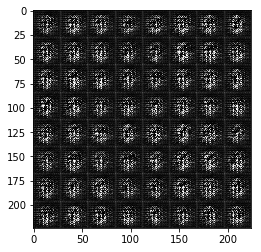

Epoch 1/2... Discriminator Loss: 0.9866... Generator Loss: 1.6561
Epoch 1/2... Discriminator Loss: 1.5295... Generator Loss: 1.0765
Epoch 1/2... Discriminator Loss: 1.2207... Generator Loss: 1.4209
Epoch 1/2... Discriminator Loss: 1.1712... Generator Loss: 0.9320
Epoch 1/2... Discriminator Loss: 1.0979... Generator Loss: 1.2628
Epoch 1/2... Discriminator Loss: 1.3737... Generator Loss: 0.6523
Epoch 1/2... Discriminator Loss: 1.2322... Generator Loss: 1.2266
Epoch 1/2... Discriminator Loss: 1.2713... Generator Loss: 1.0054
Epoch 1/2... Discriminator Loss: 1.4255... Generator Loss: 0.7951
Epoch 1/2... Discriminator Loss: 1.6488... Generator Loss: 1.6703


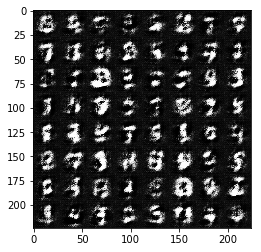

Epoch 1/2... Discriminator Loss: 1.2505... Generator Loss: 0.9669
Epoch 1/2... Discriminator Loss: 1.2785... Generator Loss: 1.1015
Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 0.9742
Epoch 1/2... Discriminator Loss: 1.2825... Generator Loss: 0.8176
Epoch 1/2... Discriminator Loss: 1.3247... Generator Loss: 0.9508
Epoch 1/2... Discriminator Loss: 1.2395... Generator Loss: 1.0016
Epoch 1/2... Discriminator Loss: 1.2718... Generator Loss: 1.0896
Epoch 1/2... Discriminator Loss: 1.2330... Generator Loss: 0.9148
Epoch 1/2... Discriminator Loss: 1.3156... Generator Loss: 0.6647
Epoch 1/2... Discriminator Loss: 1.3369... Generator Loss: 0.7651


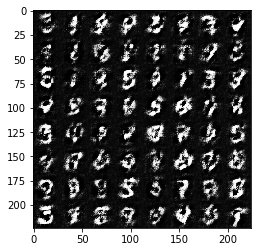

Epoch 1/2... Discriminator Loss: 1.2087... Generator Loss: 1.3144
Epoch 1/2... Discriminator Loss: 1.1995... Generator Loss: 1.0373
Epoch 1/2... Discriminator Loss: 1.3039... Generator Loss: 1.4557
Epoch 1/2... Discriminator Loss: 1.1196... Generator Loss: 0.9413
Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 1.3408
Epoch 1/2... Discriminator Loss: 1.1212... Generator Loss: 0.9093
Epoch 1/2... Discriminator Loss: 1.0664... Generator Loss: 0.9886
Epoch 1/2... Discriminator Loss: 1.0155... Generator Loss: 1.1947
Epoch 1/2... Discriminator Loss: 1.1985... Generator Loss: 0.7522
Epoch 1/2... Discriminator Loss: 1.1347... Generator Loss: 1.0374


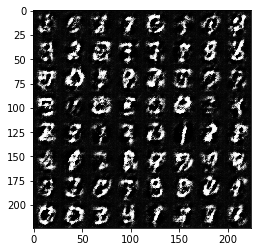

Epoch 1/2... Discriminator Loss: 1.1851... Generator Loss: 1.6267
Epoch 1/2... Discriminator Loss: 1.2868... Generator Loss: 0.6599
Epoch 1/2... Discriminator Loss: 1.3077... Generator Loss: 0.6770
Epoch 1/2... Discriminator Loss: 1.2388... Generator Loss: 0.8790
Epoch 1/2... Discriminator Loss: 1.3864... Generator Loss: 0.5070
Epoch 1/2... Discriminator Loss: 1.1943... Generator Loss: 0.9247
Epoch 1/2... Discriminator Loss: 1.4041... Generator Loss: 0.5486
Epoch 1/2... Discriminator Loss: 1.1941... Generator Loss: 0.9979
Epoch 1/2... Discriminator Loss: 1.3227... Generator Loss: 0.6767
Epoch 1/2... Discriminator Loss: 1.1847... Generator Loss: 1.2178


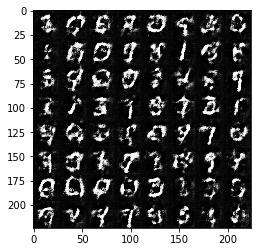

Epoch 1/2... Discriminator Loss: 1.1321... Generator Loss: 0.9927
Epoch 1/2... Discriminator Loss: 1.3356... Generator Loss: 0.5926
Epoch 1/2... Discriminator Loss: 1.3228... Generator Loss: 1.1936
Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 1.3799
Epoch 1/2... Discriminator Loss: 1.2084... Generator Loss: 0.8521
Epoch 1/2... Discriminator Loss: 1.3572... Generator Loss: 1.8678
Epoch 1/2... Discriminator Loss: 1.2174... Generator Loss: 1.1957
Epoch 1/2... Discriminator Loss: 1.1070... Generator Loss: 0.9957
Epoch 1/2... Discriminator Loss: 1.1552... Generator Loss: 0.7873
Epoch 1/2... Discriminator Loss: 1.1610... Generator Loss: 0.7619


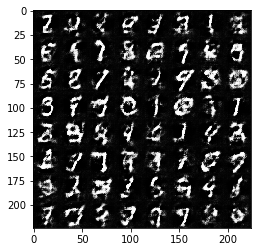

Epoch 1/2... Discriminator Loss: 1.1680... Generator Loss: 0.9173
Epoch 1/2... Discriminator Loss: 1.2637... Generator Loss: 0.5879
Epoch 1/2... Discriminator Loss: 1.2621... Generator Loss: 0.7612
Epoch 1/2... Discriminator Loss: 1.2053... Generator Loss: 0.8726
Epoch 1/2... Discriminator Loss: 1.3009... Generator Loss: 1.3635
Epoch 1/2... Discriminator Loss: 1.1283... Generator Loss: 0.9620
Epoch 1/2... Discriminator Loss: 1.2650... Generator Loss: 0.6417
Epoch 1/2... Discriminator Loss: 1.3152... Generator Loss: 0.6522
Epoch 1/2... Discriminator Loss: 1.1357... Generator Loss: 0.7651
Epoch 1/2... Discriminator Loss: 1.3462... Generator Loss: 0.7615


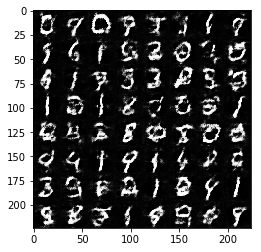

Epoch 1/2... Discriminator Loss: 1.4200... Generator Loss: 0.5471
Epoch 1/2... Discriminator Loss: 1.2638... Generator Loss: 0.7030
Epoch 1/2... Discriminator Loss: 1.4347... Generator Loss: 1.8852
Epoch 1/2... Discriminator Loss: 1.1437... Generator Loss: 1.0238
Epoch 1/2... Discriminator Loss: 1.2349... Generator Loss: 1.3960
Epoch 1/2... Discriminator Loss: 1.3019... Generator Loss: 1.5739
Epoch 1/2... Discriminator Loss: 1.0880... Generator Loss: 0.8790
Epoch 1/2... Discriminator Loss: 1.3302... Generator Loss: 0.7251
Epoch 1/2... Discriminator Loss: 1.3562... Generator Loss: 1.5418
Epoch 1/2... Discriminator Loss: 1.1869... Generator Loss: 1.2192


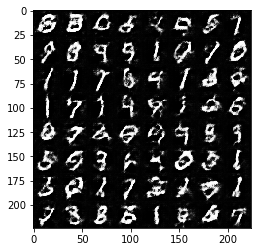

Epoch 1/2... Discriminator Loss: 1.1845... Generator Loss: 1.2064
Epoch 1/2... Discriminator Loss: 1.2521... Generator Loss: 1.5177
Epoch 1/2... Discriminator Loss: 1.1963... Generator Loss: 0.8262
Epoch 1/2... Discriminator Loss: 1.1280... Generator Loss: 0.8929
Epoch 1/2... Discriminator Loss: 1.5737... Generator Loss: 2.1715
Epoch 1/2... Discriminator Loss: 1.2060... Generator Loss: 1.2141
Epoch 1/2... Discriminator Loss: 1.2542... Generator Loss: 1.2913
Epoch 1/2... Discriminator Loss: 1.2301... Generator Loss: 1.2653
Epoch 1/2... Discriminator Loss: 1.2144... Generator Loss: 1.1981
Epoch 1/2... Discriminator Loss: 1.2192... Generator Loss: 1.0873


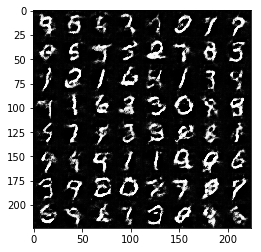

Epoch 1/2... Discriminator Loss: 1.3327... Generator Loss: 0.6225
Epoch 1/2... Discriminator Loss: 1.4337... Generator Loss: 0.5095
Epoch 1/2... Discriminator Loss: 1.1395... Generator Loss: 1.1367
Epoch 2/2... Discriminator Loss: 1.2354... Generator Loss: 1.0060
Epoch 2/2... Discriminator Loss: 1.3827... Generator Loss: 0.6378
Epoch 2/2... Discriminator Loss: 1.2758... Generator Loss: 0.7125
Epoch 2/2... Discriminator Loss: 1.1462... Generator Loss: 0.9049
Epoch 2/2... Discriminator Loss: 1.3720... Generator Loss: 1.1633
Epoch 2/2... Discriminator Loss: 1.2482... Generator Loss: 0.8472
Epoch 2/2... Discriminator Loss: 1.2014... Generator Loss: 0.8504


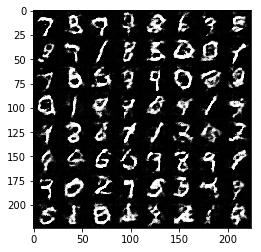

Epoch 2/2... Discriminator Loss: 1.2362... Generator Loss: 1.0528
Epoch 2/2... Discriminator Loss: 1.2320... Generator Loss: 1.0077
Epoch 2/2... Discriminator Loss: 1.3320... Generator Loss: 1.0119
Epoch 2/2... Discriminator Loss: 1.3428... Generator Loss: 0.7661
Epoch 2/2... Discriminator Loss: 1.2753... Generator Loss: 1.0793
Epoch 2/2... Discriminator Loss: 1.2003... Generator Loss: 1.3104
Epoch 2/2... Discriminator Loss: 1.3041... Generator Loss: 0.6586
Epoch 2/2... Discriminator Loss: 1.2232... Generator Loss: 0.8663
Epoch 2/2... Discriminator Loss: 1.3284... Generator Loss: 1.0727
Epoch 2/2... Discriminator Loss: 1.2673... Generator Loss: 1.1436


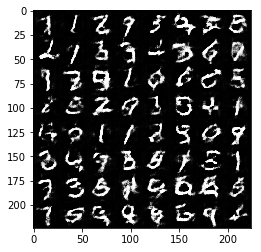

Epoch 2/2... Discriminator Loss: 1.2380... Generator Loss: 0.7573
Epoch 2/2... Discriminator Loss: 1.2254... Generator Loss: 0.8914
Epoch 2/2... Discriminator Loss: 1.2737... Generator Loss: 0.7651
Epoch 2/2... Discriminator Loss: 1.2531... Generator Loss: 0.7763
Epoch 2/2... Discriminator Loss: 1.0168... Generator Loss: 1.1160
Epoch 2/2... Discriminator Loss: 1.2817... Generator Loss: 0.7397
Epoch 2/2... Discriminator Loss: 1.1789... Generator Loss: 0.8767
Epoch 2/2... Discriminator Loss: 1.1472... Generator Loss: 0.8692
Epoch 2/2... Discriminator Loss: 1.1569... Generator Loss: 1.6143
Epoch 2/2... Discriminator Loss: 1.2043... Generator Loss: 0.7016


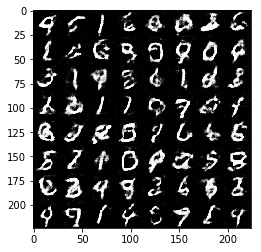

Epoch 2/2... Discriminator Loss: 1.3173... Generator Loss: 0.6682
Epoch 2/2... Discriminator Loss: 1.2332... Generator Loss: 0.9604
Epoch 2/2... Discriminator Loss: 1.0961... Generator Loss: 1.0611
Epoch 2/2... Discriminator Loss: 1.1857... Generator Loss: 0.9540
Epoch 2/2... Discriminator Loss: 1.2553... Generator Loss: 0.5633
Epoch 2/2... Discriminator Loss: 1.2560... Generator Loss: 0.8794
Epoch 2/2... Discriminator Loss: 1.2021... Generator Loss: 0.6742
Epoch 2/2... Discriminator Loss: 1.2590... Generator Loss: 0.6419
Epoch 2/2... Discriminator Loss: 1.2594... Generator Loss: 0.8368
Epoch 2/2... Discriminator Loss: 1.2133... Generator Loss: 1.0639


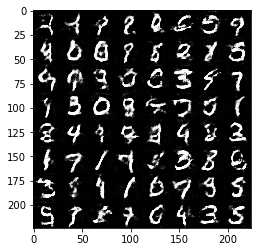

Epoch 2/2... Discriminator Loss: 1.2418... Generator Loss: 1.2303
Epoch 2/2... Discriminator Loss: 1.1569... Generator Loss: 0.7909
Epoch 2/2... Discriminator Loss: 1.2436... Generator Loss: 1.2232
Epoch 2/2... Discriminator Loss: 1.3649... Generator Loss: 0.6870
Epoch 2/2... Discriminator Loss: 1.3646... Generator Loss: 1.1949
Epoch 2/2... Discriminator Loss: 1.2014... Generator Loss: 1.4259
Epoch 2/2... Discriminator Loss: 1.2633... Generator Loss: 1.5160
Epoch 2/2... Discriminator Loss: 1.1349... Generator Loss: 0.9387
Epoch 2/2... Discriminator Loss: 1.2139... Generator Loss: 0.7848
Epoch 2/2... Discriminator Loss: 1.1902... Generator Loss: 0.8261


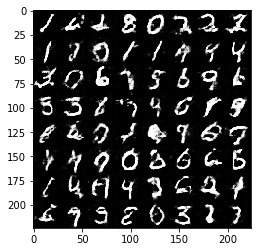

Epoch 2/2... Discriminator Loss: 1.1853... Generator Loss: 0.9113
Epoch 2/2... Discriminator Loss: 1.2325... Generator Loss: 1.1260
Epoch 2/2... Discriminator Loss: 1.1899... Generator Loss: 0.9154
Epoch 2/2... Discriminator Loss: 1.2349... Generator Loss: 0.6462
Epoch 2/2... Discriminator Loss: 1.3244... Generator Loss: 0.6234
Epoch 2/2... Discriminator Loss: 1.2237... Generator Loss: 0.8286
Epoch 2/2... Discriminator Loss: 1.0988... Generator Loss: 1.2524
Epoch 2/2... Discriminator Loss: 1.1210... Generator Loss: 1.6089
Epoch 2/2... Discriminator Loss: 1.3207... Generator Loss: 0.9063
Epoch 2/2... Discriminator Loss: 1.2354... Generator Loss: 1.6551


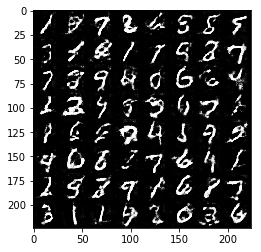

Epoch 2/2... Discriminator Loss: 1.3120... Generator Loss: 0.8368
Epoch 2/2... Discriminator Loss: 1.1026... Generator Loss: 0.8252
Epoch 2/2... Discriminator Loss: 1.3652... Generator Loss: 0.5308
Epoch 2/2... Discriminator Loss: 1.1939... Generator Loss: 0.6294
Epoch 2/2... Discriminator Loss: 1.1125... Generator Loss: 1.2376
Epoch 2/2... Discriminator Loss: 1.3237... Generator Loss: 0.6211
Epoch 2/2... Discriminator Loss: 1.2493... Generator Loss: 0.8446
Epoch 2/2... Discriminator Loss: 1.4546... Generator Loss: 0.5817
Epoch 2/2... Discriminator Loss: 1.1112... Generator Loss: 1.1483
Epoch 2/2... Discriminator Loss: 1.2088... Generator Loss: 0.7330


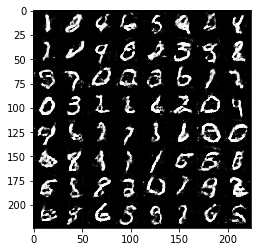

Epoch 2/2... Discriminator Loss: 1.2191... Generator Loss: 1.5774
Epoch 2/2... Discriminator Loss: 1.3501... Generator Loss: 0.8313
Epoch 2/2... Discriminator Loss: 1.2563... Generator Loss: 0.9042
Epoch 2/2... Discriminator Loss: 1.2304... Generator Loss: 0.9127
Epoch 2/2... Discriminator Loss: 1.2142... Generator Loss: 0.8719
Epoch 2/2... Discriminator Loss: 1.1778... Generator Loss: 1.4945
Epoch 2/2... Discriminator Loss: 1.2017... Generator Loss: 0.6587
Epoch 2/2... Discriminator Loss: 1.2810... Generator Loss: 0.8701
Epoch 2/2... Discriminator Loss: 1.3370... Generator Loss: 0.7129
Epoch 2/2... Discriminator Loss: 1.2559... Generator Loss: 0.7562


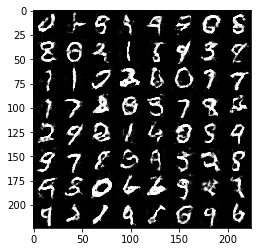

Epoch 2/2... Discriminator Loss: 1.0927... Generator Loss: 1.1903
Epoch 2/2... Discriminator Loss: 1.2342... Generator Loss: 1.4288
Epoch 2/2... Discriminator Loss: 1.3113... Generator Loss: 0.6292
Epoch 2/2... Discriminator Loss: 1.2062... Generator Loss: 1.2030
Epoch 2/2... Discriminator Loss: 1.2530... Generator Loss: 0.9955
Epoch 2/2... Discriminator Loss: 1.1904... Generator Loss: 1.2625
Epoch 2/2... Discriminator Loss: 1.2298... Generator Loss: 1.1047
Epoch 2/2... Discriminator Loss: 1.0843... Generator Loss: 0.7761
Epoch 2/2... Discriminator Loss: 1.1688... Generator Loss: 0.6061
Epoch 2/2... Discriminator Loss: 1.0969... Generator Loss: 0.7597


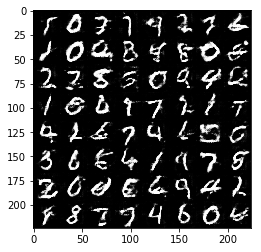

Epoch 2/2... Discriminator Loss: 1.0619... Generator Loss: 1.1012
Epoch 2/2... Discriminator Loss: 1.0022... Generator Loss: 1.0504
Epoch 2/2... Discriminator Loss: 1.2245... Generator Loss: 0.5597
Epoch 2/2... Discriminator Loss: 1.1565... Generator Loss: 0.9719
Epoch 2/2... Discriminator Loss: 1.1833... Generator Loss: 0.6899
Epoch 2/2... Discriminator Loss: 1.2495... Generator Loss: 1.0685
Epoch 2/2... Discriminator Loss: 1.3790... Generator Loss: 0.5647


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.0346... Generator Loss: 2.8379
Epoch 1/1... Discriminator Loss: 1.8776... Generator Loss: 4.7730
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 3.5740
Epoch 1/1... Discriminator Loss: 0.9335... Generator Loss: 2.5330
Epoch 1/1... Discriminator Loss: 1.0546... Generator Loss: 0.9054
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.6100
Epoch 1/1... Discriminator Loss: 0.5958... Generator Loss: 3.4293
Epoch 1/1... Discriminator Loss: 0.7176... Generator Loss: 1.4518
Epoch 1/1... Discriminator Loss: 0.5949... Generator Loss: 2.3256
Epoch 1/1... Discriminator Loss: 0.6603... Generator Loss: 1.5631


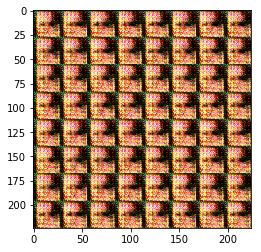

Epoch 1/1... Discriminator Loss: 0.5728... Generator Loss: 2.0318
Epoch 1/1... Discriminator Loss: 0.6338... Generator Loss: 1.9602
Epoch 1/1... Discriminator Loss: 0.9777... Generator Loss: 1.2818
Epoch 1/1... Discriminator Loss: 2.1403... Generator Loss: 4.1044
Epoch 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.6210
Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 1.8998
Epoch 1/1... Discriminator Loss: 1.3793... Generator Loss: 0.4618
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 0.8487
Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.6989
Epoch 1/1... Discriminator Loss: 1.6565... Generator Loss: 0.4040


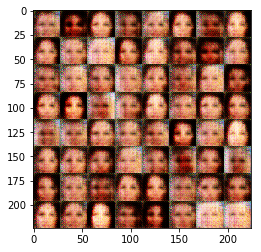

Epoch 1/1... Discriminator Loss: 1.1416... Generator Loss: 1.1035
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.8249
Epoch 1/1... Discriminator Loss: 1.1274... Generator Loss: 1.3216
Epoch 1/1... Discriminator Loss: 1.1629... Generator Loss: 0.9546
Epoch 1/1... Discriminator Loss: 1.6997... Generator Loss: 0.3916
Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.7928
Epoch 1/1... Discriminator Loss: 1.1164... Generator Loss: 1.0486
Epoch 1/1... Discriminator Loss: 1.1769... Generator Loss: 1.1860
Epoch 1/1... Discriminator Loss: 1.6072... Generator Loss: 0.5163
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 1.3600


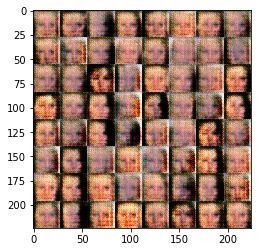

Epoch 1/1... Discriminator Loss: 1.1823... Generator Loss: 1.5137
Epoch 1/1... Discriminator Loss: 1.1703... Generator Loss: 1.1286
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 1.0599
Epoch 1/1... Discriminator Loss: 1.1625... Generator Loss: 1.0113
Epoch 1/1... Discriminator Loss: 1.2537... Generator Loss: 0.9594
Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 1.0483
Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 1.2674
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 0.9183
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 1.3330... Generator Loss: 0.8004


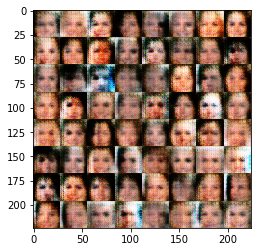

Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.9691
Epoch 1/1... Discriminator Loss: 1.5460... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.3000... Generator Loss: 0.9219
Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 1.0438
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.5794
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.7577
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 1.0745
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.9143
Epoch 1/1... Discriminator Loss: 1.5838... Generator Loss: 0.7204


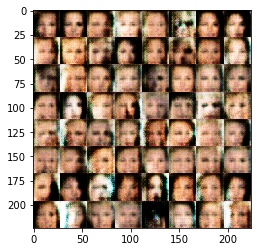

Epoch 1/1... Discriminator Loss: 1.4382... Generator Loss: 0.9945
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.8801
Epoch 1/1... Discriminator Loss: 1.5210... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.8067
Epoch 1/1... Discriminator Loss: 1.4263... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 1.4651... Generator Loss: 0.6414
Epoch 1/1... Discriminator Loss: 1.3086... Generator Loss: 0.8555


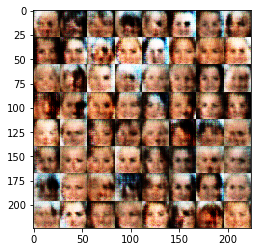

Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.6475
Epoch 1/1... Discriminator Loss: 1.3977... Generator Loss: 0.8531
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.5014... Generator Loss: 0.6306
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.7041
Epoch 1/1... Discriminator Loss: 1.2384... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.7102
Epoch 1/1... Discriminator Loss: 1.2718... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 0.7549


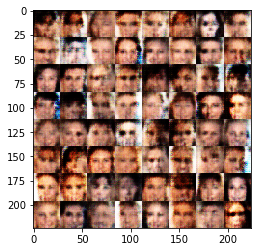

Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.8273
Epoch 1/1... Discriminator Loss: 1.3105... Generator Loss: 0.8108
Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.9158
Epoch 1/1... Discriminator Loss: 1.2055... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 1.3578... Generator Loss: 0.8936
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.8621
Epoch 1/1... Discriminator Loss: 1.3938... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.8063
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.7386
Epoch 1/1... Discriminator Loss: 1.2538... Generator Loss: 0.8970


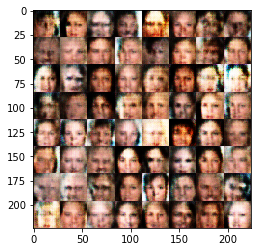

Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.9503
Epoch 1/1... Discriminator Loss: 1.3704... Generator Loss: 0.9551
Epoch 1/1... Discriminator Loss: 1.4082... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.4562... Generator Loss: 0.9137
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.9392
Epoch 1/1... Discriminator Loss: 1.3503... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 1.3247... Generator Loss: 0.7886
Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 1.1894
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 0.7625


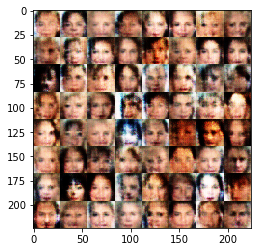

Epoch 1/1... Discriminator Loss: 1.3330... Generator Loss: 1.0121
Epoch 1/1... Discriminator Loss: 1.1761... Generator Loss: 1.1615
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.7754
Epoch 1/1... Discriminator Loss: 1.5084... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 1.2082... Generator Loss: 0.9967
Epoch 1/1... Discriminator Loss: 1.2502... Generator Loss: 1.0371
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 1.4885... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.9065
Epoch 1/1... Discriminator Loss: 1.3610... Generator Loss: 0.7243


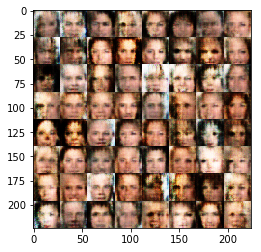

Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 0.8090
Epoch 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.7399
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.2828... Generator Loss: 0.7319
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.8140
Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.3523... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.3897... Generator Loss: 0.7386


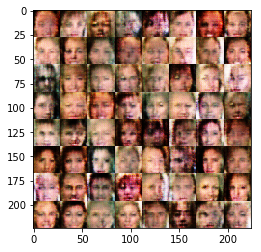

Epoch 1/1... Discriminator Loss: 1.4217... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.7853
Epoch 1/1... Discriminator Loss: 1.3915... Generator Loss: 1.0522
Epoch 1/1... Discriminator Loss: 1.2801... Generator Loss: 0.9417
Epoch 1/1... Discriminator Loss: 1.3718... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.2952... Generator Loss: 0.8208
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.8404
Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.8926
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.7902


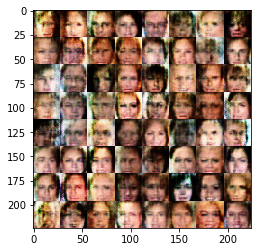

Epoch 1/1... Discriminator Loss: 1.4313... Generator Loss: 0.7066
Epoch 1/1... Discriminator Loss: 1.3724... Generator Loss: 0.7055
Epoch 1/1... Discriminator Loss: 1.3984... Generator Loss: 0.8445
Epoch 1/1... Discriminator Loss: 1.3087... Generator Loss: 0.8615
Epoch 1/1... Discriminator Loss: 1.2068... Generator Loss: 0.7998
Epoch 1/1... Discriminator Loss: 1.3389... Generator Loss: 0.7923
Epoch 1/1... Discriminator Loss: 1.3228... Generator Loss: 0.7236
Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 1.0074
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 0.8432
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 0.6225


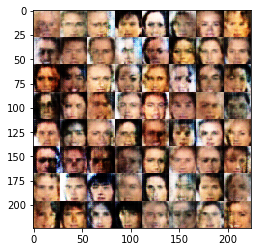

Epoch 1/1... Discriminator Loss: 1.2279... Generator Loss: 0.7887
Epoch 1/1... Discriminator Loss: 1.3556... Generator Loss: 0.8712
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.9877
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.8425
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.8268
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.7386
Epoch 1/1... Discriminator Loss: 1.4040... Generator Loss: 0.7563
Epoch 1/1... Discriminator Loss: 1.3805... Generator Loss: 0.8253
Epoch 1/1... Discriminator Loss: 1.3614... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.3694... Generator Loss: 0.8205


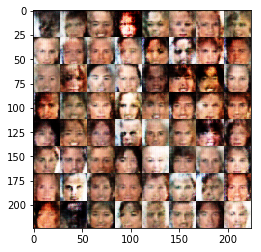

Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.8359
Epoch 1/1... Discriminator Loss: 1.3515... Generator Loss: 0.9187
Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.8954
Epoch 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.8431
Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 0.8218
Epoch 1/1... Discriminator Loss: 1.3029... Generator Loss: 0.7923
Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 1.1608
Epoch 1/1... Discriminator Loss: 1.2849... Generator Loss: 0.7184
Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.9779


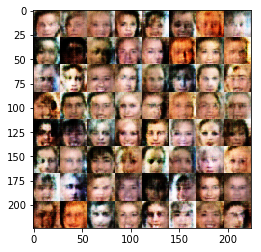

Epoch 1/1... Discriminator Loss: 1.3531... Generator Loss: 0.7838
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.9871
Epoch 1/1... Discriminator Loss: 1.2682... Generator Loss: 1.1552
Epoch 1/1... Discriminator Loss: 1.3929... Generator Loss: 0.9237
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.7690
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.6658
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 1.1434
Epoch 1/1... Discriminator Loss: 1.4448... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.7108


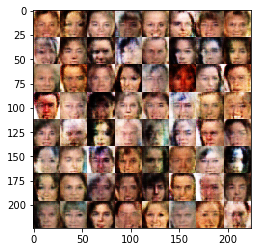

Epoch 1/1... Discriminator Loss: 1.4506... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 1.3207... Generator Loss: 0.9734
Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 1.6136... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.3297... Generator Loss: 0.8624
Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.6434
Epoch 1/1... Discriminator Loss: 1.4350... Generator Loss: 0.6206
Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.2014... Generator Loss: 0.9882


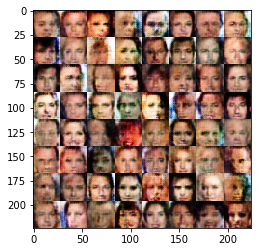

Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.7241
Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.6716
Epoch 1/1... Discriminator Loss: 1.1637... Generator Loss: 0.9626
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.2819... Generator Loss: 0.8069
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.9217
Epoch 1/1... Discriminator Loss: 1.3744... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 0.8193


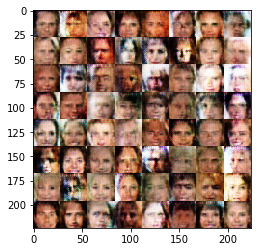

Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 1.0004
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.7119
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.2756... Generator Loss: 0.9641
Epoch 1/1... Discriminator Loss: 1.1560... Generator Loss: 0.9149
Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 0.8217
Epoch 1/1... Discriminator Loss: 1.3020... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.8796
Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.8389


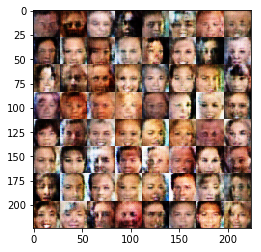

Epoch 1/1... Discriminator Loss: 1.2521... Generator Loss: 0.9860
Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.6452
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.9176
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.7425
Epoch 1/1... Discriminator Loss: 1.2241... Generator Loss: 0.7988
Epoch 1/1... Discriminator Loss: 1.2229... Generator Loss: 0.6457
Epoch 1/1... Discriminator Loss: 1.1793... Generator Loss: 0.9890
Epoch 1/1... Discriminator Loss: 1.1543... Generator Loss: 0.9361
Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.8707


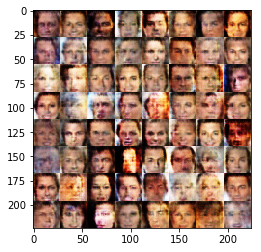

Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 0.8082
Epoch 1/1... Discriminator Loss: 1.3474... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.7148
Epoch 1/1... Discriminator Loss: 1.2360... Generator Loss: 0.8220
Epoch 1/1... Discriminator Loss: 1.2351... Generator Loss: 0.8069
Epoch 1/1... Discriminator Loss: 1.4194... Generator Loss: 0.8623
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.4219... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.2977... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.6556


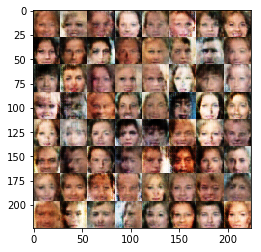

Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.3127... Generator Loss: 0.9649
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.6566
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.8544
Epoch 1/1... Discriminator Loss: 1.4407... Generator Loss: 1.1942
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 0.7890
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.6746


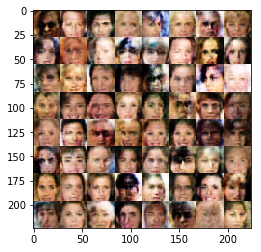

Epoch 1/1... Discriminator Loss: 1.5158... Generator Loss: 0.5966
Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 0.8810
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.8411
Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.9241
Epoch 1/1... Discriminator Loss: 1.3563... Generator Loss: 0.8190
Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.9054
Epoch 1/1... Discriminator Loss: 1.2039... Generator Loss: 0.9629
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.6272
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.8939


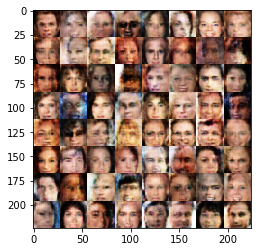

Epoch 1/1... Discriminator Loss: 1.5353... Generator Loss: 0.7420
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.9653
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.9308
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.9682
Epoch 1/1... Discriminator Loss: 1.3198... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.9100
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.9107


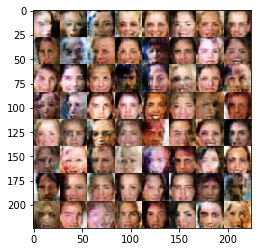

Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.7615
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.9187
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 1.5023... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 1.3764... Generator Loss: 0.9519
Epoch 1/1... Discriminator Loss: 1.3881... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.7373
Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 1.0218
Epoch 1/1... Discriminator Loss: 1.2733... Generator Loss: 0.8516


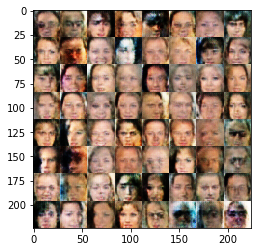

Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.6794
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.7559
Epoch 1/1... Discriminator Loss: 1.2259... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.3025... Generator Loss: 0.8848
Epoch 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.6139
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.9302


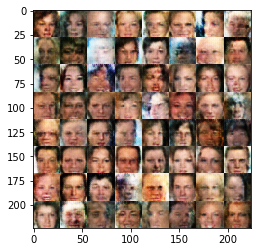

Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.7731
Epoch 1/1... Discriminator Loss: 1.3134... Generator Loss: 0.7876
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.8496
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 0.8678
Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 1.0579
Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.3481... Generator Loss: 0.8997
Epoch 1/1... Discriminator Loss: 1.3106... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.2642... Generator Loss: 0.8520


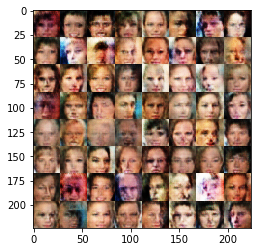

Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 0.9049
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.8438
Epoch 1/1... Discriminator Loss: 1.5811... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.3565... Generator Loss: 0.7934
Epoch 1/1... Discriminator Loss: 1.2805... Generator Loss: 0.8417
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.7009
Epoch 1/1... Discriminator Loss: 1.2254... Generator Loss: 0.8778
Epoch 1/1... Discriminator Loss: 1.2278... Generator Loss: 1.0673
Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 0.7208


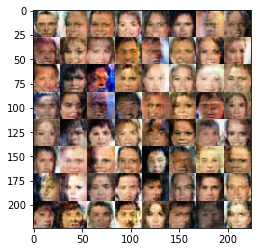

Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.8518
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.6490
Epoch 1/1... Discriminator Loss: 1.5278... Generator Loss: 0.5803
Epoch 1/1... Discriminator Loss: 1.2346... Generator Loss: 0.8279
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.6977
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.3064... Generator Loss: 0.7514
Epoch 1/1... Discriminator Loss: 1.5324... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.8975
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.7122


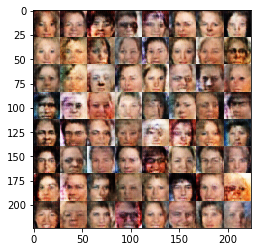

Epoch 1/1... Discriminator Loss: 1.4501... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 1.6577... Generator Loss: 0.5727
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.5936
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.8297
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.8020
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.2872... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.9036


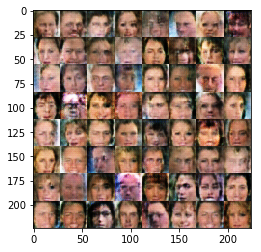

Epoch 1/1... Discriminator Loss: 1.2735... Generator Loss: 0.9176
Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.7666
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.8512
Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.7566
Epoch 1/1... Discriminator Loss: 1.4200... Generator Loss: 0.7758
Epoch 1/1... Discriminator Loss: 1.4567... Generator Loss: 0.7810
Epoch 1/1... Discriminator Loss: 1.3020... Generator Loss: 0.9389
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.7251


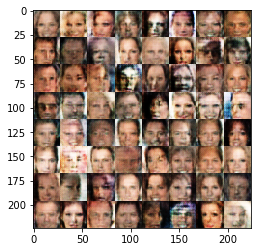

Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.4190... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.8940
Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.7952
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.8070
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.8048
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.7516


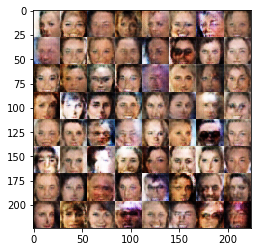

Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.7115
Epoch 1/1... Discriminator Loss: 1.2331... Generator Loss: 0.8048
Epoch 1/1... Discriminator Loss: 1.3112... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.7957
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.7715
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 0.8040
Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 0.9672
Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.6926


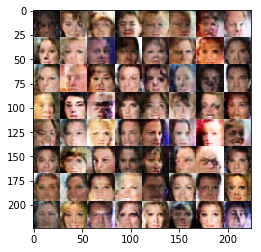

Epoch 1/1... Discriminator Loss: 1.2557... Generator Loss: 0.9164
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.7049
Epoch 1/1... Discriminator Loss: 1.3427... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 1.4177... Generator Loss: 0.6446
Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.8367
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 1.5025... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.6616
Epoch 1/1... Discriminator Loss: 1.2841... Generator Loss: 0.8548


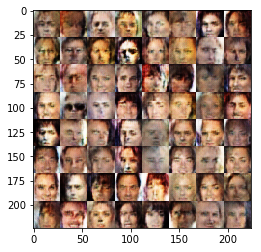

Epoch 1/1... Discriminator Loss: 1.3623... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.3134... Generator Loss: 0.7928
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.8210
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.7218
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.7934
Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.7052
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 1.4334... Generator Loss: 0.7939
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.7109


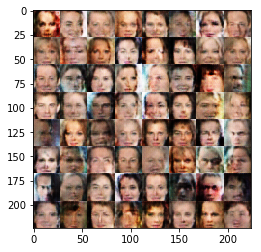

Epoch 1/1... Discriminator Loss: 1.3291... Generator Loss: 0.7014
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.7010
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.6871
Epoch 1/1... Discriminator Loss: 1.1708... Generator Loss: 0.8366
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.7347
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.6373
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.8400
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.8035
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.7330


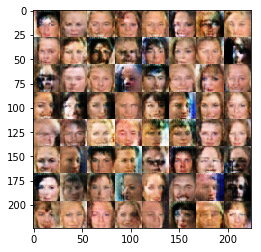

Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.6900
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.8222
Epoch 1/1... Discriminator Loss: 1.2843... Generator Loss: 0.7709
Epoch 1/1... Discriminator Loss: 1.4727... Generator Loss: 0.7676
Epoch 1/1... Discriminator Loss: 1.4616... Generator Loss: 0.7419
Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 0.8630
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.8108
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.6385
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.7868


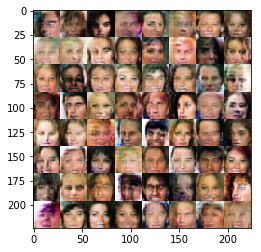

Epoch 1/1... Discriminator Loss: 1.3561... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.3030... Generator Loss: 0.7601
Epoch 1/1... Discriminator Loss: 1.4176... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.5095... Generator Loss: 0.6837
Epoch 1/1... Discriminator Loss: 1.2111... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.6591
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.7645


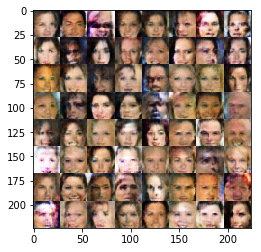

Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.7419
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.6469
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.8419
Epoch 1/1... Discriminator Loss: 1.2705... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.8125


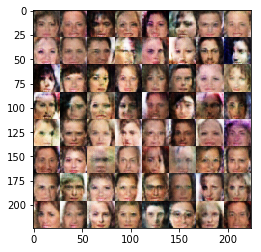

Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.3537... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4244... Generator Loss: 0.7862
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.9326
Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 0.8581
Epoch 1/1... Discriminator Loss: 1.4799... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.9832
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.4602... Generator Loss: 0.7445


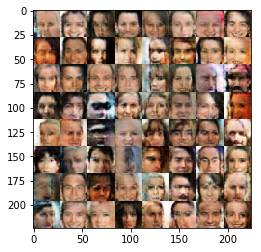

Epoch 1/1... Discriminator Loss: 1.4696... Generator Loss: 0.6972
Epoch 1/1... Discriminator Loss: 1.2798... Generator Loss: 0.8400
Epoch 1/1... Discriminator Loss: 1.4449... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.8126
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.6631
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.9009
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.7993
Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.8711


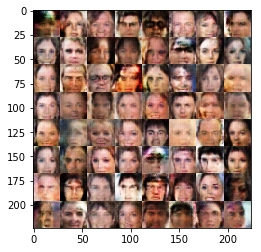

Epoch 1/1... Discriminator Loss: 1.3450... Generator Loss: 0.6741
Epoch 1/1... Discriminator Loss: 1.3084... Generator Loss: 0.8006
Epoch 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 1.3815... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.3478... Generator Loss: 0.8398
Epoch 1/1... Discriminator Loss: 1.2947... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.6952
Epoch 1/1... Discriminator Loss: 1.5068... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 0.9120
Epoch 1/1... Discriminator Loss: 1.1850... Generator Loss: 0.9483


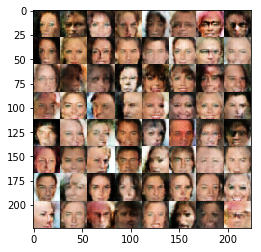

Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.7649
Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.2487... Generator Loss: 0.7474
Epoch 1/1... Discriminator Loss: 1.3126... Generator Loss: 0.8261
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.8321
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.8784
Epoch 1/1... Discriminator Loss: 1.4771... Generator Loss: 0.6577
Epoch 1/1... Discriminator Loss: 1.3565... Generator Loss: 0.7690


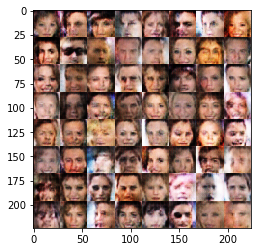

Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.7809
Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.2165... Generator Loss: 0.8474
Epoch 1/1... Discriminator Loss: 1.2887... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.7707
Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 0.6589
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.8773
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 0.9788
Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 0.7564


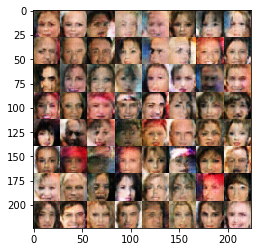

Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.6625
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 1.3235... Generator Loss: 0.7278
Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 1.3179... Generator Loss: 0.7279
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.7530


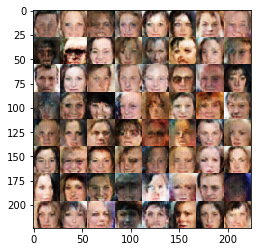

Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.8692
Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 0.8287
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.7930
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.8030
Epoch 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 1.2645... Generator Loss: 0.8104
Epoch 1/1... Discriminator Loss: 1.2928... Generator Loss: 0.7863
Epoch 1/1... Discriminator Loss: 1.4394... Generator Loss: 0.8076
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.7214


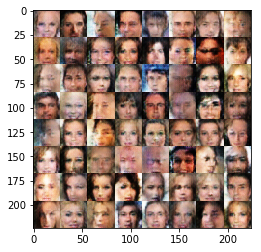

Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.8047
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.2948... Generator Loss: 0.8492
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.3551... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.8284
Epoch 1/1... Discriminator Loss: 1.3526... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.7553


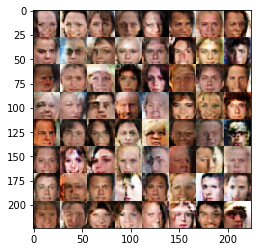

Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.8730
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.6905
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.6937
Epoch 1/1... Discriminator Loss: 1.2079... Generator Loss: 0.9308
Epoch 1/1... Discriminator Loss: 1.5070... Generator Loss: 0.7245
Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 0.9195
Epoch 1/1... Discriminator Loss: 1.5060... Generator Loss: 0.8004
Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.8584
Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 0.7311


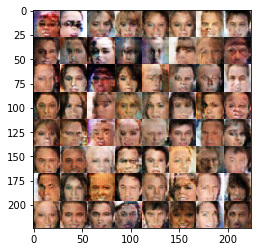

Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.3975... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.8326
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.4515... Generator Loss: 0.7481
Epoch 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.8655
Epoch 1/1... Discriminator Loss: 1.3106... Generator Loss: 0.8013
Epoch 1/1... Discriminator Loss: 1.4858... Generator Loss: 0.6323
Epoch 1/1... Discriminator Loss: 1.3204... Generator Loss: 0.8590
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.7321


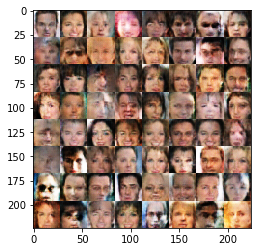

Epoch 1/1... Discriminator Loss: 1.2923... Generator Loss: 0.7964
Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.7896
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.7808
Epoch 1/1... Discriminator Loss: 1.4893... Generator Loss: 0.7574
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.7734
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.6967
Epoch 1/1... Discriminator Loss: 1.3500... Generator Loss: 0.8316
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.7996
Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.7994
Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.7417


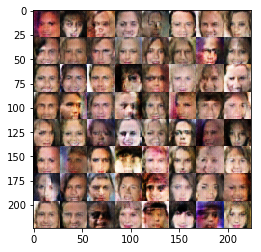

Epoch 1/1... Discriminator Loss: 1.3111... Generator Loss: 0.8946
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.7009
Epoch 1/1... Discriminator Loss: 1.3270... Generator Loss: 0.7833
Epoch 1/1... Discriminator Loss: 1.2805... Generator Loss: 0.8523
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.8461
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.7731
Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.6806
Epoch 1/1... Discriminator Loss: 1.1512... Generator Loss: 0.9284
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.6956
Epoch 1/1... Discriminator Loss: 1.2064... Generator Loss: 0.8429


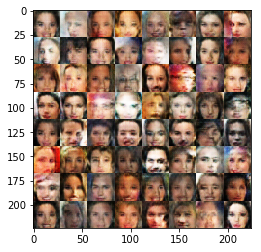

Epoch 1/1... Discriminator Loss: 1.5073... Generator Loss: 0.7042
Epoch 1/1... Discriminator Loss: 1.4950... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.4386... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.7866
Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.8600
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 0.7984
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.8120
Epoch 1/1... Discriminator Loss: 1.4190... Generator Loss: 0.8539


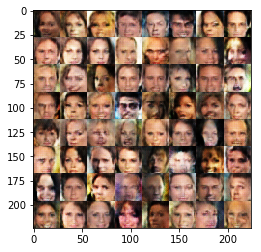

Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.7521
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.7291
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.7243
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.8528
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.8794
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.2723... Generator Loss: 0.8278


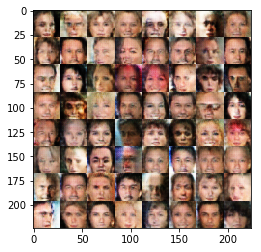

Epoch 1/1... Discriminator Loss: 1.3377... Generator Loss: 0.7207
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.8764
Epoch 1/1... Discriminator Loss: 1.2810... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 1.4472... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.8166
Epoch 1/1... Discriminator Loss: 1.4490... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 0.8197


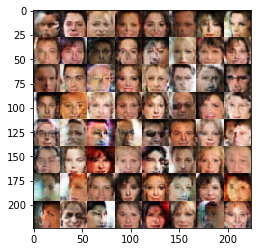

Epoch 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.8319
Epoch 1/1... Discriminator Loss: 1.5340... Generator Loss: 0.5820
Epoch 1/1... Discriminator Loss: 1.3163... Generator Loss: 0.9163
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.6929
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.3197... Generator Loss: 0.8527
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 0.8279
Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.7026
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.7443


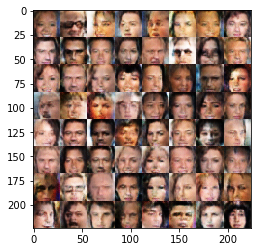

Epoch 1/1... Discriminator Loss: 1.4575... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.8214
Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.8395
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.3442... Generator Loss: 0.7558
Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.3499... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.4728... Generator Loss: 0.7364
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.6848


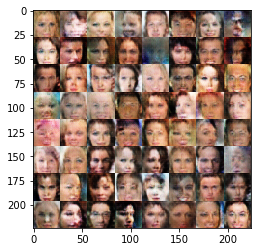

Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.9156
Epoch 1/1... Discriminator Loss: 1.2004... Generator Loss: 0.8882
Epoch 1/1... Discriminator Loss: 1.3459... Generator Loss: 0.8180
Epoch 1/1... Discriminator Loss: 1.4049... Generator Loss: 0.8380
Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.8669
Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.7351


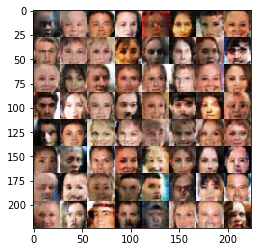

Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.8075
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.8093
Epoch 1/1... Discriminator Loss: 1.3493... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.4816... Generator Loss: 0.8639
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.7530
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.8495
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.8241
Epoch 1/1... Discriminator Loss: 1.3682... Generator Loss: 0.8128
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.6796
Epoch 1/1... Discriminator Loss: 1.4604... Generator Loss: 0.6834


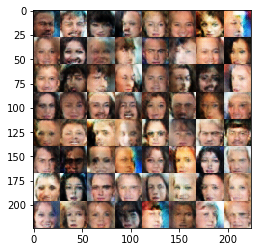

Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.7548
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7782
Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.8183
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.7894
Epoch 1/1... Discriminator Loss: 1.3026... Generator Loss: 0.8526
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.8005
Epoch 1/1... Discriminator Loss: 1.5382... Generator Loss: 0.6777
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.2413... Generator Loss: 0.8538


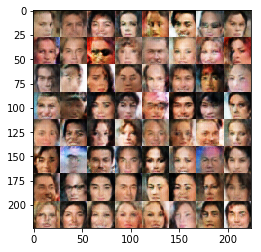

Epoch 1/1... Discriminator Loss: 1.3157... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.7706
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6224
Epoch 1/1... Discriminator Loss: 1.3325... Generator Loss: 0.8149
Epoch 1/1... Discriminator Loss: 1.4633... Generator Loss: 0.7502
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.7449
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.7239
Epoch 1/1... Discriminator Loss: 1.3257... Generator Loss: 0.8969
Epoch 1/1... Discriminator Loss: 1.2573... Generator Loss: 0.8367
Epoch 1/1... Discriminator Loss: 1.3977... Generator Loss: 0.7895


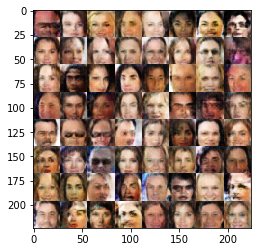

Epoch 1/1... Discriminator Loss: 1.4338... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.7904
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.8587
Epoch 1/1... Discriminator Loss: 1.2783... Generator Loss: 0.8801
Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.8641
Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.6974
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.8141


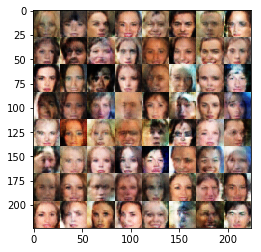

Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.8458
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.7970
Epoch 1/1... Discriminator Loss: 1.3878... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.6852
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.7089


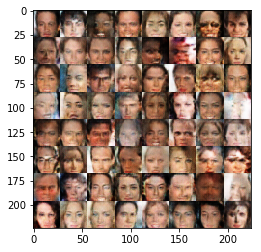

Epoch 1/1... Discriminator Loss: 1.3927... Generator Loss: 0.7824
Epoch 1/1... Discriminator Loss: 1.3373... Generator Loss: 0.9046
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.7731
Epoch 1/1... Discriminator Loss: 1.2462... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.3459... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.7362
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.7353
Epoch 1/1... Discriminator Loss: 1.2476... Generator Loss: 0.9508
Epoch 1/1... Discriminator Loss: 1.3613... Generator Loss: 0.8144
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.7081


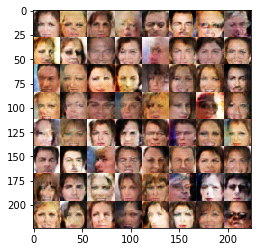

Epoch 1/1... Discriminator Loss: 1.4588... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.2596... Generator Loss: 0.9872


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0004
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.